In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score


In [ ]:
from google.colab import drive
drive.mount("/content/drive")
data = pd.read_csv("drive/MyDrive/Trabalho IA/iris-synthetic.csv") #se o separador entre cada coluna for diferente de ',', então teria que especificar comoum parâmetro

print(data)

Mounted at /content/drive
       Id  SepalLengthCm  SepalWidthCm  PetalLengthCm  PetalWidthCm  \
0       7            4.6           3.1            1.4           0.3   
1       7            4.6           2.9            1.4           0.3   
2      19            5.7           2.9            1.7           0.3   
3      31            4.8           4.1            1.6           0.2   
4      25            4.8           3.0            1.9           0.2   
...   ...            ...           ...            ...           ...   
4995   96            5.7           3.0            4.2           1.2   
4996   66            6.7           3.1            4.4           1.4   
4997  142            6.9           3.1            5.1           2.3   
4998   87            6.7           3.1            4.7           1.5   
4999   88            6.3           2.3            4.4           1.3   

              Species  
0         Iris-setosa  
1         Iris-setosa  
2         Iris-setosa  
3         Iris-setosa  
4

In [ ]:
data

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,7,4.6,3.1,1.4,0.3,Iris-setosa
1,7,4.6,2.9,1.4,0.3,Iris-setosa
2,19,5.7,2.9,1.7,0.3,Iris-setosa
3,31,4.8,4.1,1.6,0.2,Iris-setosa
4,25,4.8,3.0,1.9,0.2,Iris-setosa
...,...,...,...,...,...,...
4995,96,5.7,3.0,4.2,1.2,Iris-versicolor
4996,66,6.7,3.1,4.4,1.4,Iris-versicolor
4997,142,6.9,3.1,5.1,2.3,Iris-virginica
4998,87,6.7,3.1,4.7,1.5,Iris-versicolor


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             5000 non-null   int64  
 1   SepalLengthCm  5000 non-null   float64
 2   SepalWidthCm   5000 non-null   float64
 3   PetalLengthCm  5000 non-null   float64
 4   PetalWidthCm   5000 non-null   float64
 5   Species        5000 non-null   object 
dtypes: float64(4), int64(1), object(1)
memory usage: 234.5+ KB


In [ ]:
data["Sepal_Petal_Length"] = data["SepalLengthCm"] / data["PetalLengthCm"]
data["Sepal_Petal_Width"] = data["SepalWidthCm"] / data["PetalWidthCm"]

In [ ]:
data

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species,Sepal_Petal_Length,Sepal_Petal_Width
0,7,4.6,3.1,1.4,0.3,Iris-setosa,3.285714,10.333333
1,7,4.6,2.9,1.4,0.3,Iris-setosa,3.285714,9.666667
2,19,5.7,2.9,1.7,0.3,Iris-setosa,3.352941,9.666667
3,31,4.8,4.1,1.6,0.2,Iris-setosa,3.000000,20.500000
4,25,4.8,3.0,1.9,0.2,Iris-setosa,2.526316,15.000000
...,...,...,...,...,...,...,...,...
4995,96,5.7,3.0,4.2,1.2,Iris-versicolor,1.357143,2.500000
4996,66,6.7,3.1,4.4,1.4,Iris-versicolor,1.522727,2.214286
4997,142,6.9,3.1,5.1,2.3,Iris-virginica,1.352941,1.347826
4998,87,6.7,3.1,4.7,1.5,Iris-versicolor,1.425532,2.066667


In [ ]:
data.Species.value_counts()

Iris-setosa        1987
Iris-virginica     1653
Iris-versicolor    1360
Name: Species, dtype: int64

In [ ]:
data['SpeciesCat']=data.Species.astype('category').cat.codes

In [ ]:
data

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species,Sepal_Petal_Length,Sepal_Petal_Width,SpeciesCat
0,7,4.6,3.1,1.4,0.3,Iris-setosa,3.285714,10.333333,0
1,7,4.6,2.9,1.4,0.3,Iris-setosa,3.285714,9.666667,0
2,19,5.7,2.9,1.7,0.3,Iris-setosa,3.352941,9.666667,0
3,31,4.8,4.1,1.6,0.2,Iris-setosa,3.000000,20.500000,0
4,25,4.8,3.0,1.9,0.2,Iris-setosa,2.526316,15.000000,0
...,...,...,...,...,...,...,...,...,...
4995,96,5.7,3.0,4.2,1.2,Iris-versicolor,1.357143,2.500000,1
4996,66,6.7,3.1,4.4,1.4,Iris-versicolor,1.522727,2.214286,1
4997,142,6.9,3.1,5.1,2.3,Iris-virginica,1.352941,1.347826,2
4998,87,6.7,3.1,4.7,1.5,Iris-versicolor,1.425532,2.066667,1


In [ ]:
data.corr()

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Sepal_Petal_Length,Sepal_Petal_Width,SpeciesCat
Id,1.000000,0.733668,-0.417347,0.890929,0.905684,-0.842330,-0.716977,0.936822
SepalLengthCm,0.733668,1.000000,-0.208220,0.872421,0.826156,-0.723781,-0.662363,0.789909
SepalWidthCm,-0.417347,-0.208220,1.000000,-0.469543,-0.426078,0.576209,0.533883,-0.461156
PetalLengthCm,0.890929,0.872421,-0.469543,1.000000,0.966552,-0.945601,-0.802107,0.951394
PetalWidthCm,0.905684,0.826156,-0.426078,0.966552,1.000000,-0.910623,-0.814132,0.955579
Sepal_Petal_Length,-0.842330,-0.723781,0.576209,-0.945601,-0.910623,1.000000,0.820938,-0.890698
Sepal_Petal_Width,-0.716977,-0.662363,0.533883,-0.802107,-0.814132,0.820938,1.000000,-0.756526
SpeciesCat,0.936822,0.789909,-0.461156,0.951394,0.955579,-0.890698,-0.756526,1.000000


<AxesSubplot:>

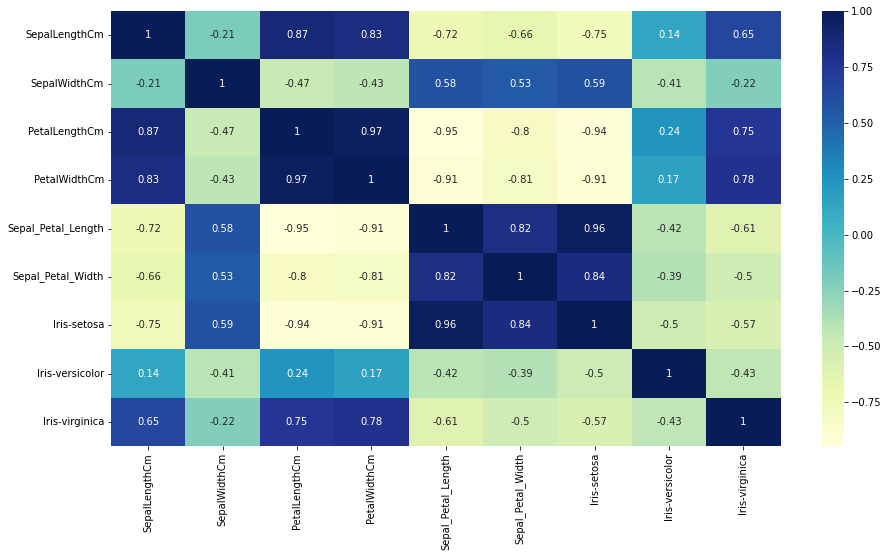

In [ ]:
dataToCorr = data.drop(["Id"], axis=1)
dataToCorr = dataToCorr.drop(["SpeciesCat"], axis=1)
dataToCorr = dataToCorr.join(pd.get_dummies(dataToCorr.Species))
plt.figure(figsize=(15, 8))
sns.heatmap(dataToCorr.corr(), annot=True, cmap="YlGnBu")

In [ ]:
data['SpeciesCat']=data.Species.astype('category').cat.codes

In [ ]:
X = data[["SepalLengthCm", "SepalWidthCm", "PetalLengthCm", "PetalWidthCm"]]
X

,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm
0,4.6,3.1,1.4,0.3
1,4.6,2.9,1.4,0.3
2,5.7,2.9,1.7,0.3
3,4.8,4.1,1.6,0.2
4,4.8,3.0,1.9,0.2
...,...,...,...,...
4995,5.7,3.0,4.2,1.2
4996,6.7,3.1,4.4,1.4
4997,6.9,3.1,5.1,2.3
4998,6.7,3.1,4.7,1.5


In [ ]:
Y = data[["SpeciesCat"]]
Y

,SpeciesCat
0,0
1,0
2,0
3,0
4,0
...,...
4995,1
4996,1
4997,2
4998,1


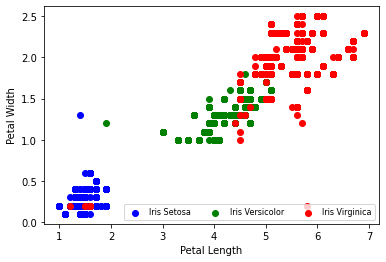

In [ ]:
dataCat0 = data[data["SpeciesCat"] == 0]
dataCat0
X_0 = dataCat0[["PetalLengthCm"]]
Y_0 = dataCat0[["PetalWidthCm"]]

dataCat1 = data[data["SpeciesCat"] == 1]
dataCat1

X_1 = dataCat1[["PetalLengthCm"]]
Y_1 = dataCat1[["PetalWidthCm"]]


dataCat2 = data[data["SpeciesCat"] == 2]
dataCat2

X_2 = dataCat2[["PetalLengthCm"]]
Y_2 = dataCat2[["PetalWidthCm"]]

plt0 = plt.scatter(X_0, Y_0, c ="blue", label="Iris Setosa")
plt1 = plt.scatter(X_1, Y_1, c ="green", label="Iris Versicolor")
plt2 = plt.scatter(X_2, Y_2, c ="red", label="Iris Virginica")

plt.legend((plt0, plt1, plt2),
           ('Iris Setosa', 'Iris Versicolor', 'Iris Virginica'),
           scatterpoints=1,
           loc='best',
           ncol=3,
           fontsize=8)

plt.xlabel("Petal Length")
plt.ylabel("Petal Width")
plt.show()

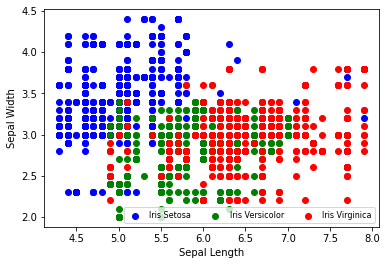

In [ ]:
dataCat0 = data[data["SpeciesCat"] == 0]
dataCat0
X_0 = dataCat0[["SepalLengthCm"]]
Y_0 = dataCat0[["SepalWidthCm"]]

dataCat1 = data[data["SpeciesCat"] == 1]
dataCat1

X_1 = dataCat1[["SepalLengthCm"]]
Y_1 = dataCat1[["SepalWidthCm"]]


dataCat2 = data[data["SpeciesCat"] == 2]
dataCat2

X_2 = dataCat2[["SepalLengthCm"]]
Y_2 = dataCat2[["SepalWidthCm"]]

plt0 = plt.scatter(X_0, Y_0, c ="blue", label="Iris Setosa")
plt1 = plt.scatter(X_1, Y_1, c ="green", label="Iris Versicolor")
plt2 = plt.scatter(X_2, Y_2, c ="red", label="Iris Virginica")

plt.legend((plt0, plt1, plt2),
           ('Iris Setosa', 'Iris Versicolor', 'Iris Virginica'),
           scatterpoints=1,
           loc='best',
           ncol=3,
           fontsize=8)

plt.xlabel("Sepal Length")
plt.ylabel("Sepal Width")
plt.show()

**Dividindo dataset em 2 partes - 70% para treino e 30% para teste**

In [ ]:
# O tamanho da base de teste será de 30%, enquanto que a base de treino terá 70%
from sklearn.model_selection import train_test_split
X_train, X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.3,random_state=100)


**Realizando normalização dos dados**

In [ ]:
from sklearn import preprocessing
scaler = preprocessing.MinMaxScaler()
columns_X_train = X_train.keys()
columns_X_test = X_test.keys()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_train = pd.DataFrame(X_train, columns=columns_X_train)
X_test = pd.DataFrame(X_test, columns=columns_X_test)
X_train

,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm
0,0.277778,0.708333,0.084746,0.041667
1,0.194444,0.625000,0.050847,0.083333
2,0.500000,0.250000,0.779661,0.541667
3,0.111111,0.916667,0.101695,0.041667
4,0.666667,0.541667,0.796610,0.833333
...,...,...,...,...
3495,0.111111,0.500000,0.101695,0.041667
3496,0.833333,0.375000,0.898305,0.708333
3497,0.222222,0.583333,0.084746,0.083333
3498,0.222222,0.750000,0.152542,0.125000


In [ ]:
Y_train

,SpeciesCat
4966,0
4086,0
2881,2
1237,0
1429,2
...,...
4149,0
1890,2
350,0
79,0


In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3500 entries, 0 to 3499
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   SepalLengthCm  3500 non-null   float64
 1   SepalWidthCm   3500 non-null   float64
 2   PetalLengthCm  3500 non-null   float64
 3   PetalWidthCm   3500 non-null   float64
dtypes: float64(4)
memory usage: 109.5 KB


In [ ]:
def printMetrics(Y_test_pm, Predicted_pm):
  rf1_pm = f1_score(Y_test_pm, Predicted_pm, average = 'macro')
  rP_pm  = precision_score(Y_test_pm, Predicted_pm, average = 'macro')
  rr_pm = recall_score(Y_test_pm, Predicted_pm, average = 'macro')
  print("F1 Score: " + str(rf1_pm))
  print("Precision: " + str(rP_pm))
  print("Recall: " + str(rr_pm))

**Prevendo valores com Logistic Regression**

In [ ]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(max_iter=300)
lr.fit(X_train,Y_train)

/usr/local/lib/python3.9/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression(max_iter=300)

In [ ]:
lr.score(X_test, Y_test)

0.9626666666666667

In [ ]:
LRY_pred = lr.predict(X_test)
LRY_pred

array([0, 2, 2, ..., 0, 0, 2], dtype=int8)

In [ ]:
printMetrics(Y_test, LRY_pred)

F1 Score: 0.9592996275478777
Precision: 0.9626603131378874
Recall: 0.9580675874646495


In [ ]:
data

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species,Sepal_Petal_Length,Sepal_Petal_Width,SpeciesCat
0,7,4.6,3.1,1.4,0.3,Iris-setosa,3.285714,10.333333,0
1,7,4.6,2.9,1.4,0.3,Iris-setosa,3.285714,9.666667,0
2,19,5.7,2.9,1.7,0.3,Iris-setosa,3.352941,9.666667,0
3,31,4.8,4.1,1.6,0.2,Iris-setosa,3.000000,20.500000,0
4,25,4.8,3.0,1.9,0.2,Iris-setosa,2.526316,15.000000,0
...,...,...,...,...,...,...,...,...,...
4995,96,5.7,3.0,4.2,1.2,Iris-versicolor,1.357143,2.500000,1
4996,66,6.7,3.1,4.4,1.4,Iris-versicolor,1.522727,2.214286,1
4997,142,6.9,3.1,5.1,2.3,Iris-virginica,1.352941,1.347826,2
4998,87,6.7,3.1,4.7,1.5,Iris-versicolor,1.425532,2.066667,1


In [ ]:
def printResultPrediction(X_test_p, Y_test_p, Y_pred_p):
  result = X_test_p.copy()
  result
  #result["ActualSpecie"] = Y_test_p
  #result["PredictedSpecie"] = Y_pred_p
  #result["Validation"] = result.apply(lambda x: "True" if x["ActualSpecie"] == x["PredictedSpecie"] else "False", axis=1)
  return result

# Imprimindo registros, sua classe real e a classe determinada por Regressão Logística
printResultPrediction(X_test, Y_test, LRY_pred)

,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm
0,0.222222,0.875000,0.101695,0.041667
1,0.611111,0.416667,0.711864,0.791667
2,0.527778,0.333333,0.644068,0.708333
3,0.472222,0.083333,0.508475,0.375000
4,0.694444,0.458333,0.762712,0.833333
...,...,...,...,...
1495,0.055556,0.125000,0.050847,0.083333
1496,0.305556,0.791667,0.050847,0.125000
1497,0.083333,0.583333,0.067797,0.083333
1498,0.000000,0.416667,0.016949,0.000000


In [ ]:
LR_cm = confusion_matrix(Y_test, LRY_pred)
LR_cm

array([[584,   0,   1],
       [  0, 391,  45],
       [  3,   7, 469]])

**Prevendo valores com Random Forest**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
forest = RandomForestClassifier()
modelRF = forest.fit(X_train, Y_train)
estimator = forest.estimators_[5]


<ipython-input-29-afea7e8dad75>:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  modelRF = forest.fit(X_train, Y_train)


In [ ]:
# Verificando a acurácia com os dados de teste
modelRF.score(X_test, Y_test)

0.9926666666666667

In [ ]:
# Imprimindo matrix de confusão
RFYPredicted = modelRF.predict(X_test)
cm = confusion_matrix(Y_test, RFYPredicted)
cm

array([[584,   0,   1],
       [  0, 431,   5],
       [  2,   3, 474]])

In [ ]:
# Verificando os valores que foram adivinhados com Random Forest
RFPredicted = modelRF.predict(X_test)

In [ ]:
printMetrics(Y_test, RFPredicted)

F1 Score: 0.9922574677543046
Precision: 0.9923915294401366
Recall: 0.9921280983403907


In [ ]:
# Imprimindo registros, sua classe real e a classe determinada por Regressão Logística
printResultPrediction(X_test, Y_test, RFPredicted)

,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm
0,0.222222,0.875000,0.101695,0.041667
1,0.611111,0.416667,0.711864,0.791667
2,0.527778,0.333333,0.644068,0.708333
3,0.472222,0.083333,0.508475,0.375000
4,0.694444,0.458333,0.762712,0.833333
...,...,...,...,...
1495,0.055556,0.125000,0.050847,0.083333
1496,0.305556,0.791667,0.050847,0.125000
1497,0.083333,0.583333,0.067797,0.083333
1498,0.000000,0.416667,0.016949,0.000000


**Random Forest - mostrando exemplo de árvore gerada**

In [ ]:
# Gerando a árvore de decisão
from sklearn.tree import export_graphviz
# Export as dot file
features = ["SepalLengthCm","SepalWidthCm", "PetalLengthCm", "PetalWidthCm"]
export_graphviz(estimator, out_file='tree.dot',
                feature_names = features,
                class_names = data["Species"],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

In [ ]:
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

0

In [ ]:
from IPython.display import Image
Image(filename = 'tree.png')

**Prevendo valores com Decision Tree**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier(criterion="entropy",random_state=200)
# Realizando o treinamento
modelDT = classifier.fit(X_train, Y_train)

In [ ]:
# Verificando a eficiência com os dados de teste
modelDT.score(X_test, Y_test)

0.992

In [ ]:
DTYPredicted = modelDT.predict(X_test)
# Matriz de confusão
confusion_matrix(Y_test, DTYPredicted)

array([[584,   0,   1],
       [  0, 430,   6],
       [  2,   3, 474]])

In [ ]:
printMetrics(Y_test, DTYPredicted)

F1 Score: 0.9915271184097731
Precision: 0.9917018698990655
Recall: 0.991363572346507


In [ ]:
# Imprimindo registros, sua classe real e a classe determinada por Regressão Logística
printResultPrediction(X_test, Y_test, DTYPredicted)

,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm
0,0.222222,0.875000,0.101695,0.041667
1,0.611111,0.416667,0.711864,0.791667
2,0.527778,0.333333,0.644068,0.708333
3,0.472222,0.083333,0.508475,0.375000
4,0.694444,0.458333,0.762712,0.833333
...,...,...,...,...
1495,0.055556,0.125000,0.050847,0.083333
1496,0.305556,0.791667,0.050847,0.125000
1497,0.083333,0.583333,0.067797,0.083333
1498,0.000000,0.416667,0.016949,0.000000


**Prevendo valores com K-Nearest-Neighbors**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier, NearestNeighbors
# Realizando o treinamento
knn = KNeighborsClassifier(n_neighbors = 3)
modelKNN = knn.fit(X_train, Y_train)

/usr/local/lib/python3.9/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


In [ ]:
# Verificando a acurácia do modelo K-Nearest-Neighbors
modelKNN.score(X_test, Y_test)

0.9906666666666667

In [ ]:
KNNYPredicted = modelKNN.predict(X_test)

# Imprimindo a matriz de confusão
confusion_matrix(Y_test, KNNYPredicted)

array([[584,   0,   1],
       [  0, 430,   6],
       [  3,   4, 472]])

In [ ]:
printMetrics(Y_test, KNNYPredicted)

F1 Score: 0.9901596663791746
Precision: 0.990352966298094
Recall: 0.9899717838983512


In [ ]:
# Imprimindo registros, sua classe real e a classe determinada por Regressão Logística
printResultPrediction(X_test, Y_test, KNNYPredicted)

,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm
0,0.222222,0.875000,0.101695,0.041667
1,0.611111,0.416667,0.711864,0.791667
2,0.527778,0.333333,0.644068,0.708333
3,0.472222,0.083333,0.508475,0.375000
4,0.694444,0.458333,0.762712,0.833333
...,...,...,...,...
1495,0.055556,0.125000,0.050847,0.083333
1496,0.305556,0.791667,0.050847,0.125000
1497,0.083333,0.583333,0.067797,0.083333
1498,0.000000,0.416667,0.016949,0.000000
